In [65]:
import pandas as pd
import matplotlib.pyplot as plt
import warnings


import seaborn as sns
import kaleido

from wordcloud import WordCloud

warnings.filterwarnings('ignore')

In [57]:
df = pd.read_csv('../data/restaurants.csv')
df.head()

,name,rating,price,categories,latitude,longitude,league,team,stadium,team_latitude,team_longitude,state,city
0,Oriole,5.0,4.0,newamerican,41.886097,-87.644948,NBA,Chicago Bulls,United Center,41.880556,-87.674167,Illinois,Chicago
1,Spinning J Bakery and Soda Fountain,4.5,2.0,"coffee, breakfast_brunch, sandwiches",41.899450,-87.697160,NBA,Chicago Bulls,United Center,41.880556,-87.674167,Illinois,Chicago
2,S.K.Y.,4.5,3.0,"newamerican, cocktailbars, wine_bars",41.857808,-87.658043,NBA,Chicago Bulls,United Center,41.880556,-87.674167,Illinois,Chicago
3,Kai Zan,4.5,3.0,"asianfusion, japanese, sushi",41.895505,-87.691541,NBA,Chicago Bulls,United Center,41.880556,-87.674167,Illinois,Chicago
4,Sabroso! Mexican Grill,4.5,2.0,"mexican, breakfast_brunch, newmexican",41.893190,-87.667530,NBA,Chicago Bulls,United Center,41.880556,-87.674167,Illinois,Chicago


In [58]:
scatter_df = df[['price', 'rating', 'state', 'name']]
scatter_df.dropna(inplace=True)
scatter_df['state'] = scatter_df['state'].apply(clean_state)
scatter_df = scatter_df.groupby('state').mean().reset_index()

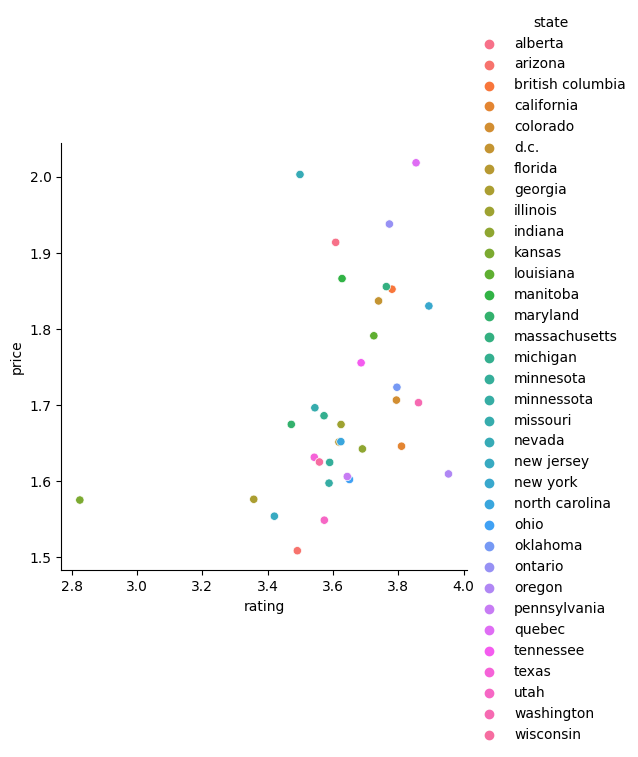

In [76]:
fig = sns.relplot(data=scatter_df, x='rating', y='price', hue='state')
fig.figure.savefig('../visuals/scatter.png',dpi=300, bbox_inches = "tight")


<Figure size 640x480 with 0 Axes>

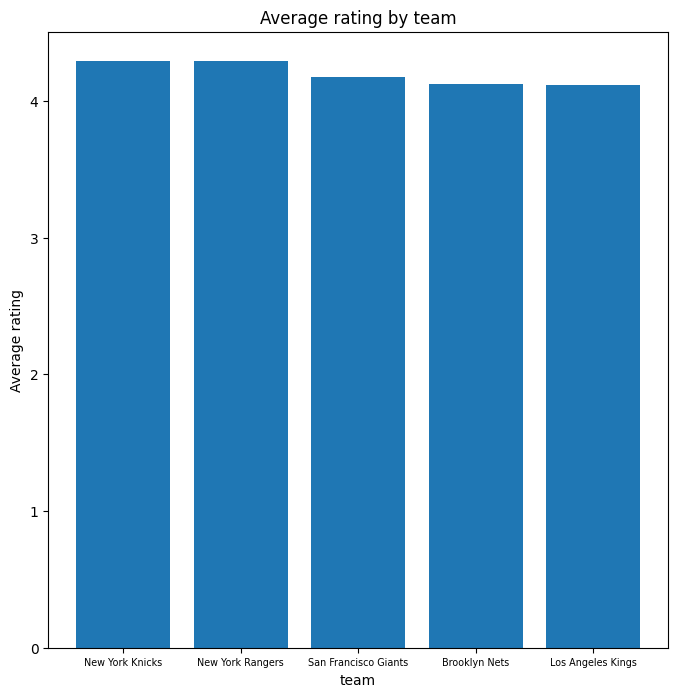

<Figure size 640x480 with 0 Axes>

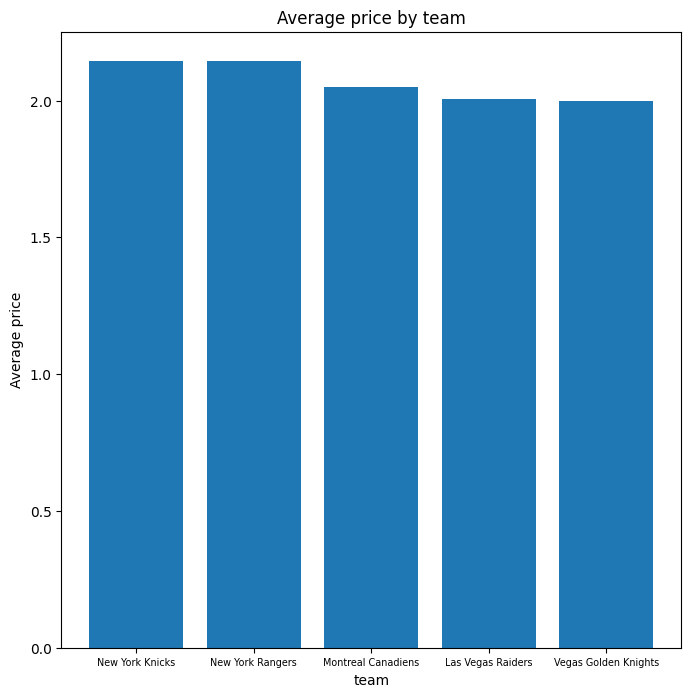

<Figure size 640x480 with 0 Axes>

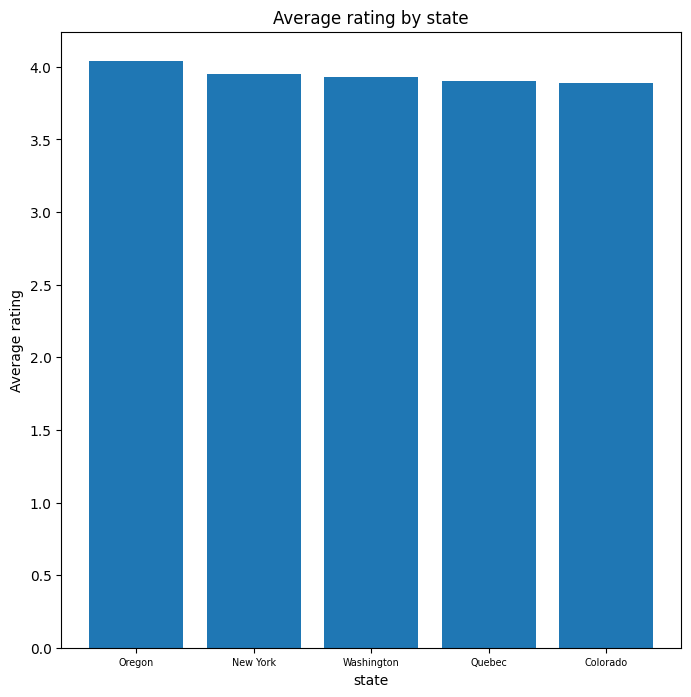

<Figure size 640x480 with 0 Axes>

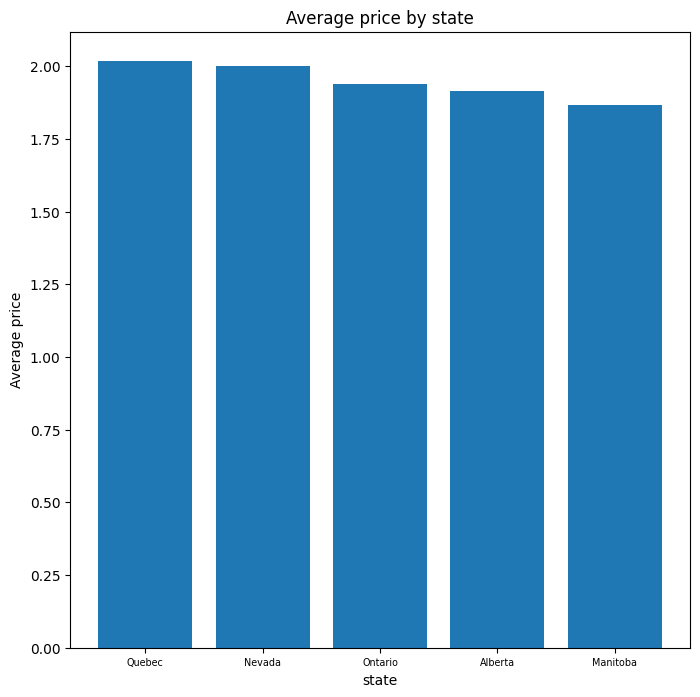

<Figure size 640x480 with 0 Axes>

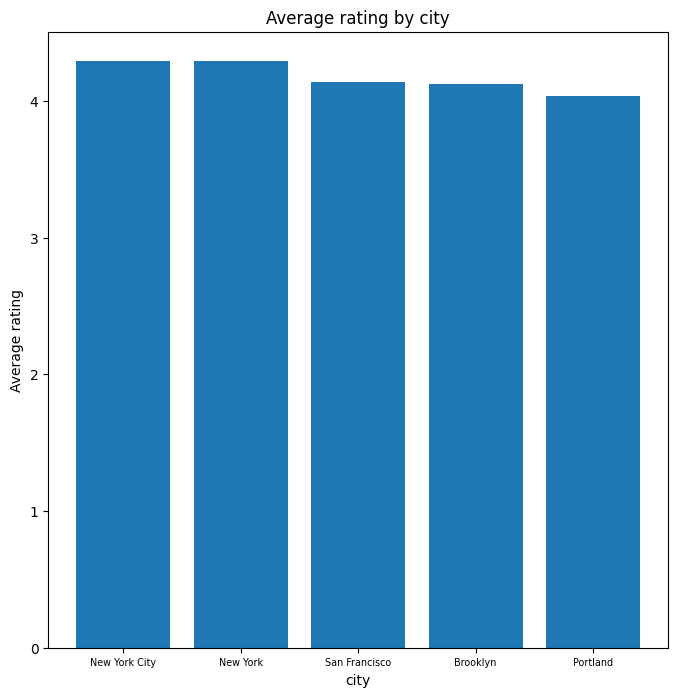

<Figure size 640x480 with 0 Axes>

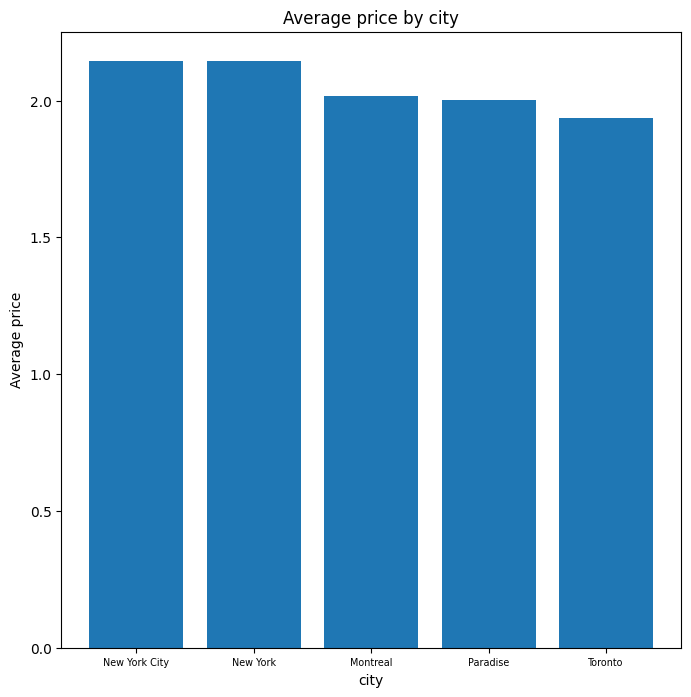

In [44]:
# Plot 1: What Stadiums, States, Cities have the highest average rating, price? 
groupby_options = ['team', 'state', 'city']
measure_options = ['rating', 'price']

def options_plot(df, gb, m):
    
    plt.figure()
    
    grouping = df.groupby(gb)[m].mean().sort_values(ascending=False)[:5]
    plotting_df = pd.DataFrame(grouping).reset_index()
    
    fig, ax = plt.subplots(figsize=(8,8))
    
    plt.bar(plotting_df[gb], plotting_df[m])
    
    title = 'Average {0} by {1}'.format(m, gb)
    plt.title(title)
    plt.xlabel(gb)
    plt.ylabel('Average {0}'.format(m))
    plt.xticks(fontsize='x-small')
    
    return fig, ax, title

for gb in groupby_options:
    
    for m in measure_options:
        
        plot, ax, title = options_plot(df, gb, m)
        
        path = '../visuals/' + title + '.png'
        plot.savefig(path)

In [17]:
# Do regional differences exist? 

def clean_cats(cat):
    
    if not pd.isnull(cat):
        
        cat += ', '
        
    return cat

def clean_state(state):
    
    state = state.lower()
    new_york = ['new york', 'new york city', 'manhattan', 'brooklyn', 'queens', 'bronx', 'long island']
    
    if state in new_york:
        state = 'new york'
    elif state == 'bc':
        state = 'british columbia'
    
    return state
    
    
# make a word cloud for each state
state_genre = df[['state', 'categories']]
state_genre['state'] = state_genre['state'].apply(clean_state)
state_genre['categories'] = state_genre['categories'].apply(clean_cats)
state_genre = state_genre.groupby('state')#['categories'].sum()

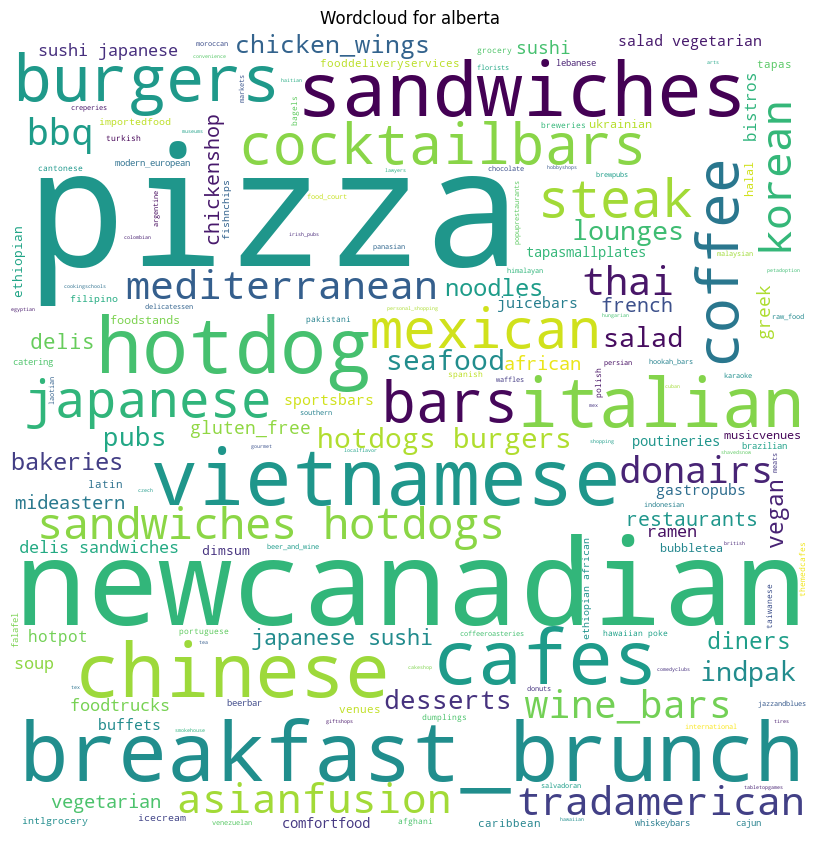

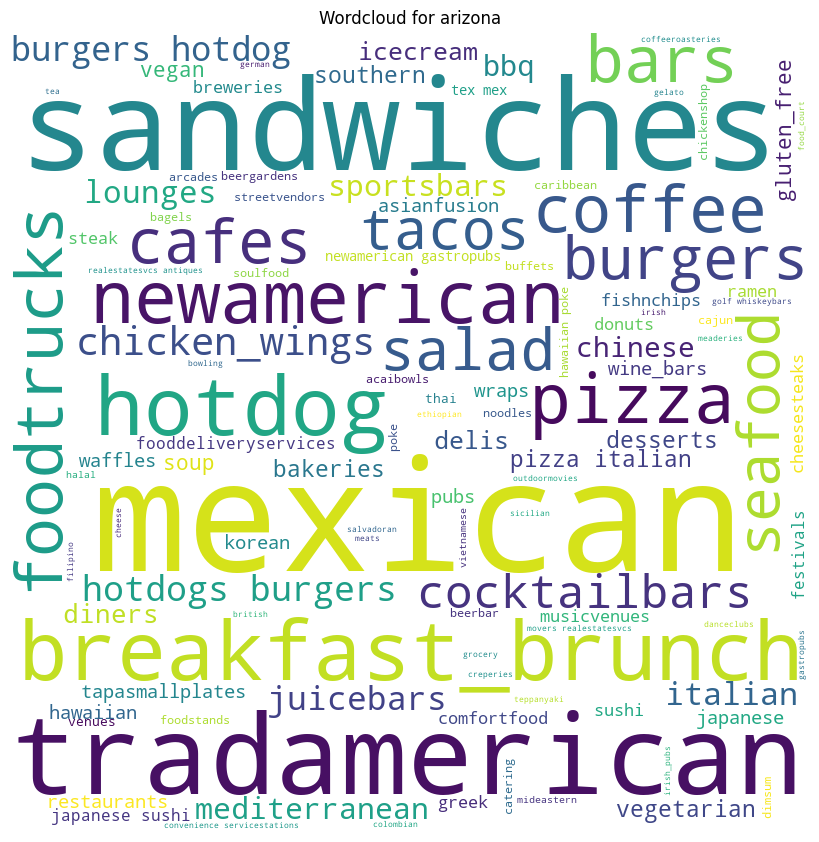

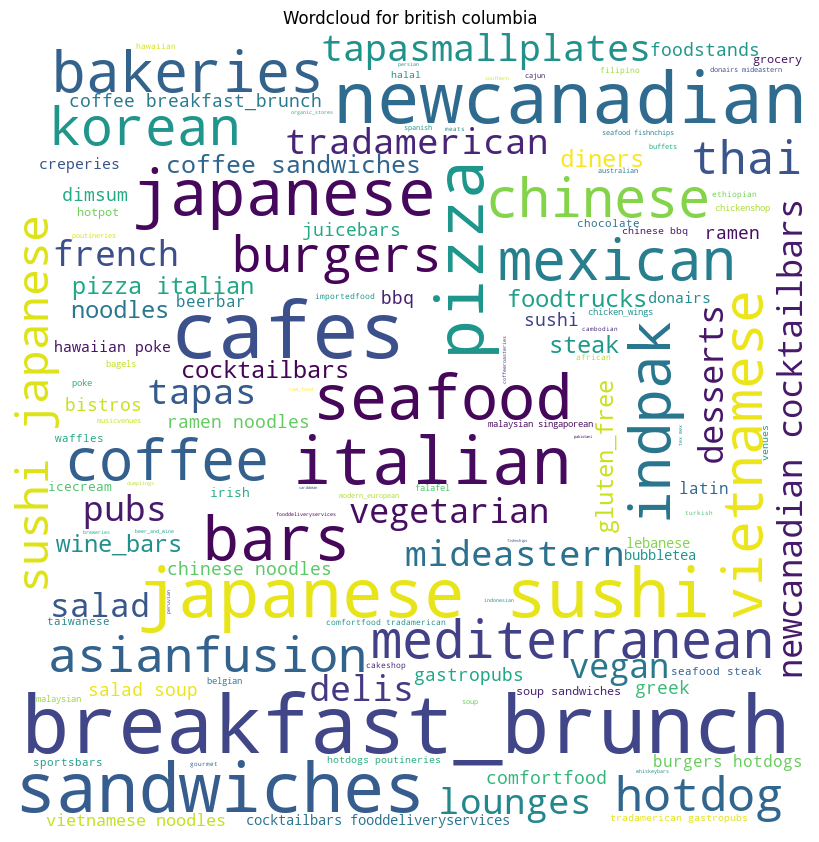

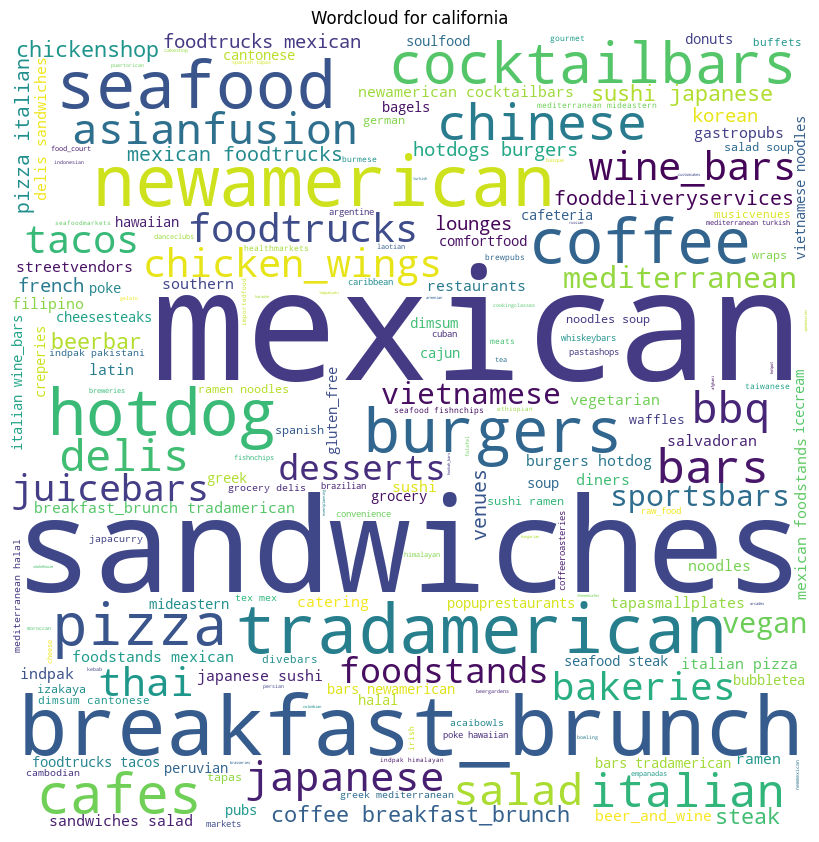

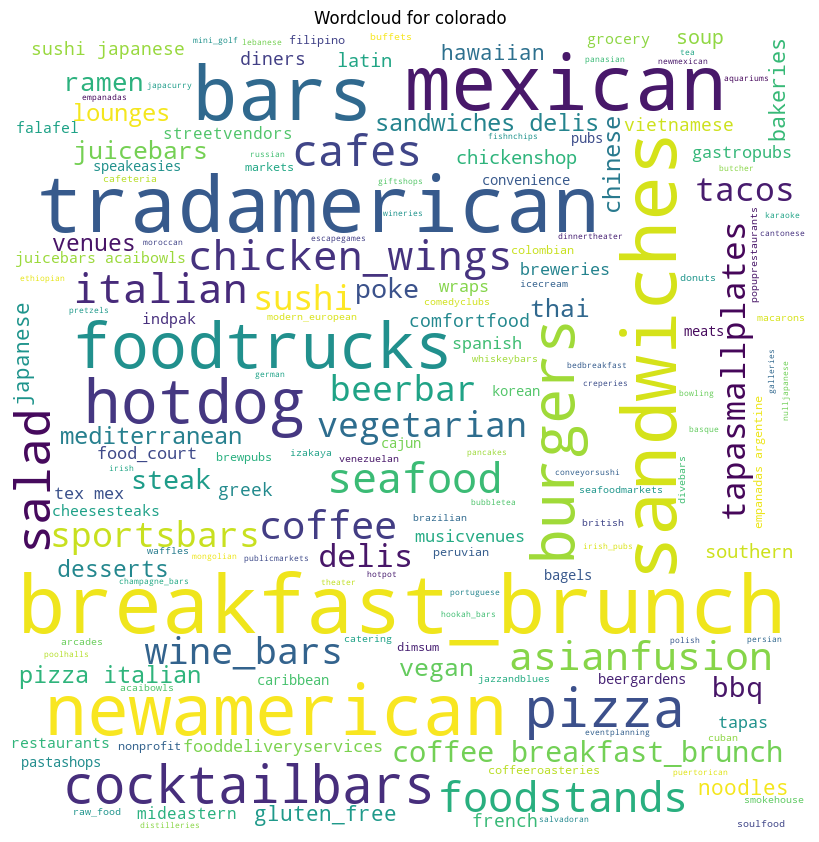

...

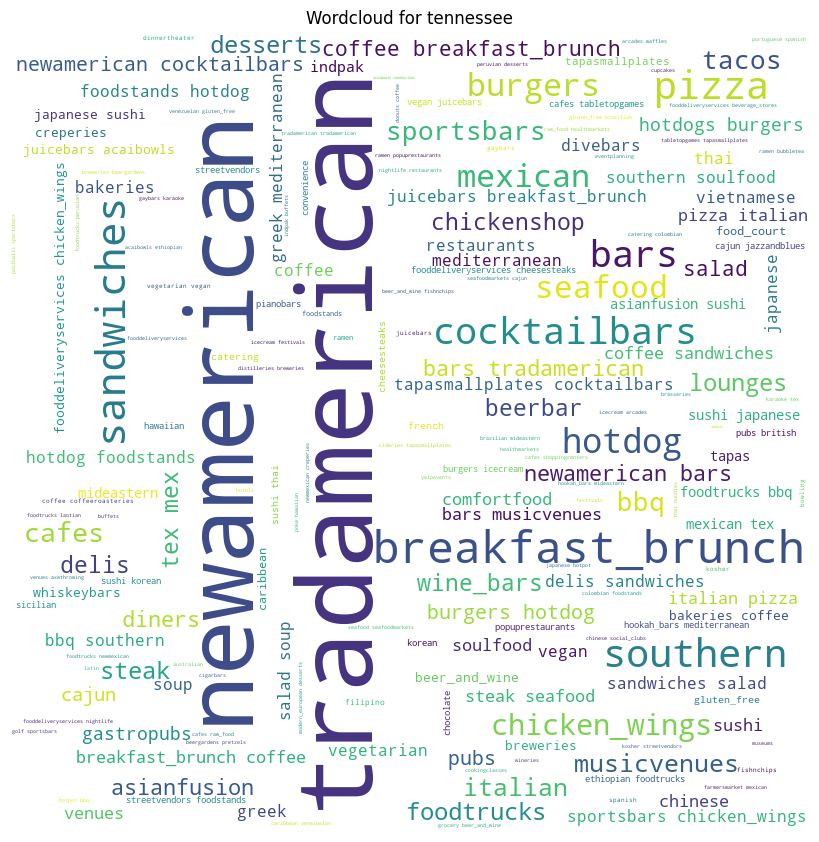

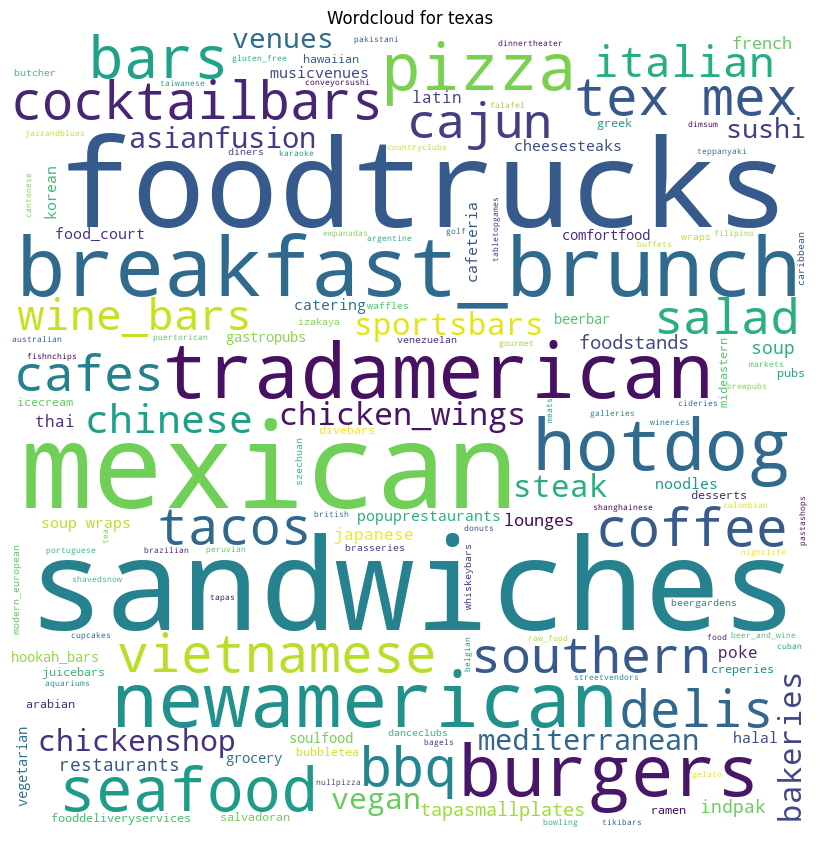

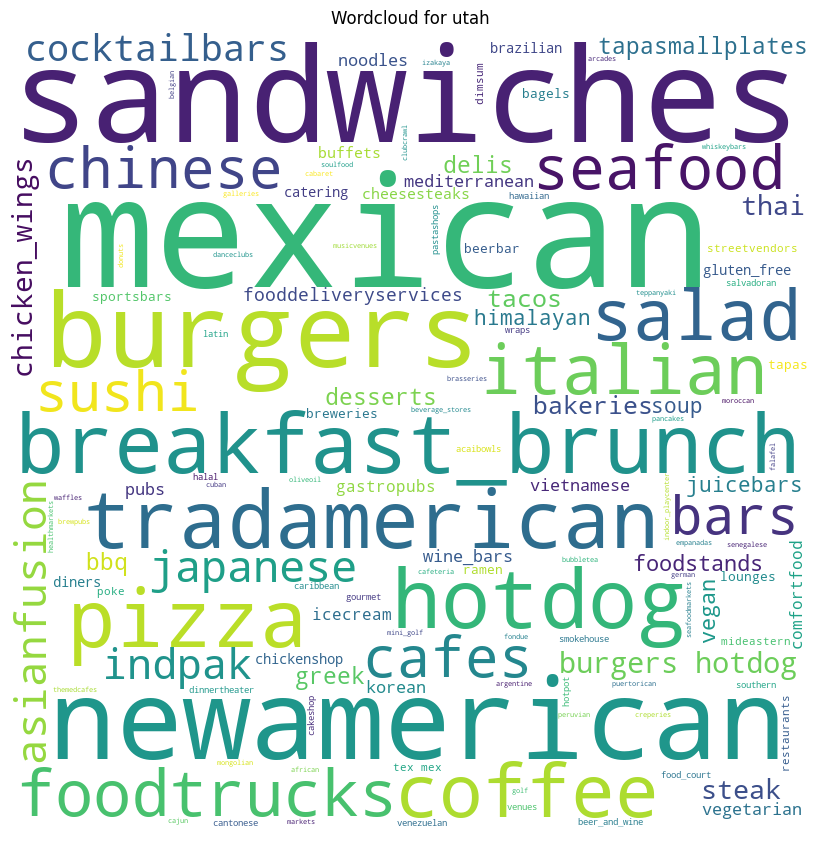

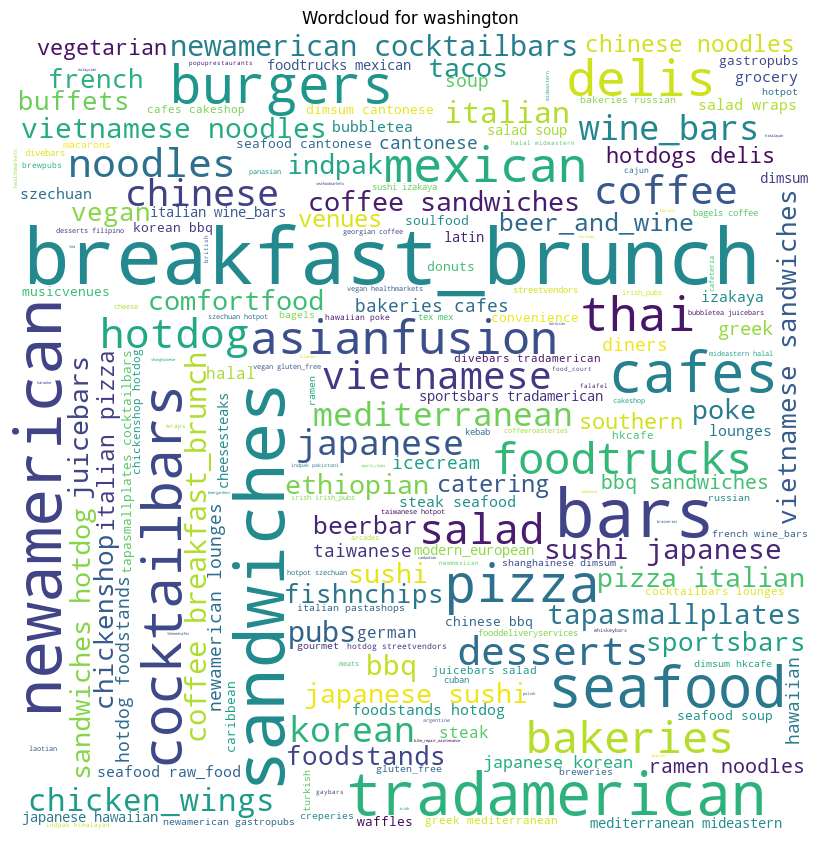

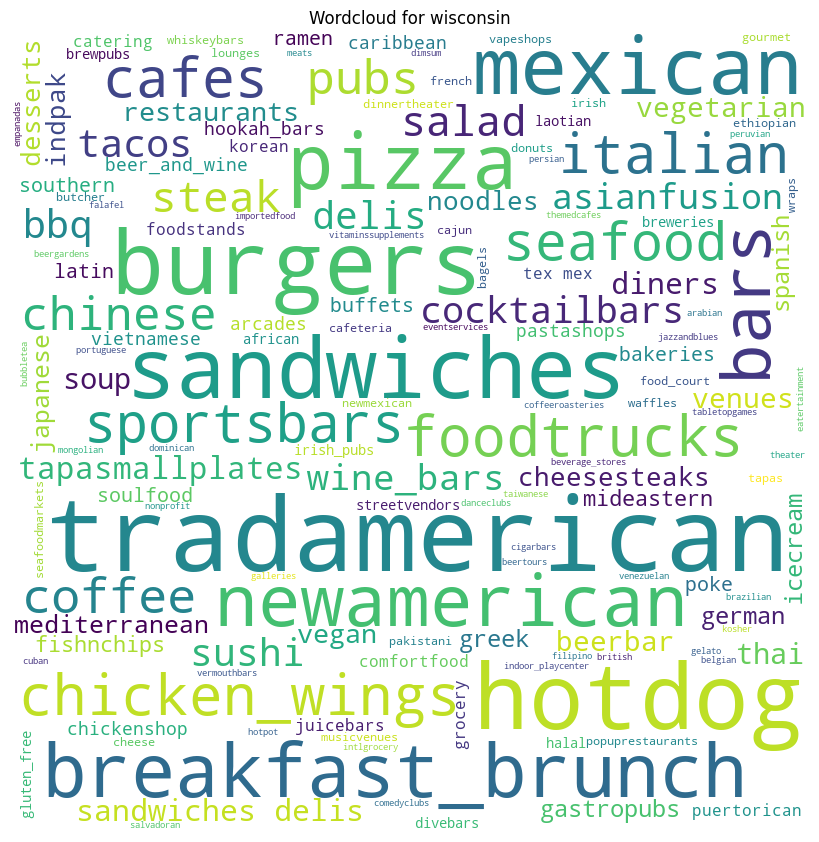

In [20]:
for state, group in state_genre:
    
    tags = ''
    for cat in group['categories']:
        if pd.isnull(cat):
            tags = 'null'
        else:
            tags += cat
        
    
#     # Combine all the categories tags for this state into a single string
#     tags = ' '.join([tag for categories in group['categories'] for tag in categories])
    
    # Generate a wordcloud for this state
    wordcloud = WordCloud(width=800, height=800, background_color='white').generate(tags)
    
    # Plot the wordcloud for this state
    plt.figure(figsize=(8, 8), facecolor=None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.title(f"Wordcloud for {state}")
    plt.show()

In [27]:
# what are the worst offenders? 
!pip install plotly
import plotly.express as px

  Using cached plotly-5.13.1-py2.py3-none-any.whl (15.2 MB)
  Using cached tenacity-8.2.2-py3-none-any.whl (24 kB)


In [29]:
df

,name,rating,price,categories,latitude,longitude,league,team,stadium,team_latitude,team_longitude,state,city
0,Oriole,5.0,4.0,newamerican,41.886097,-87.644948,NBA,Chicago Bulls,United Center,41.880556,-87.674167,Illinois,Chicago
1,Spinning J Bakery and Soda Fountain,4.5,2.0,"coffee, breakfast_brunch, sandwiches",41.899450,-87.697160,NBA,Chicago Bulls,United Center,41.880556,-87.674167,Illinois,Chicago
2,S.K.Y.,4.5,3.0,"newamerican, cocktailbars, wine_bars",41.857808,-87.658043,NBA,Chicago Bulls,United Center,41.880556,-87.674167,Illinois,Chicago
3,Kai Zan,4.5,3.0,"asianfusion, japanese, sushi",41.895505,-87.691541,NBA,Chicago Bulls,United Center,41.880556,-87.674167,Illinois,Chicago
4,Sabroso! Mexican Grill,4.5,2.0,"mexican, breakfast_brunch, newmexican",41.893190,-87.667530,NBA,Chicago Bulls,United Center,41.880556,-87.674167,Illinois,Chicago
...,...,...,...,...,...,...,...,...,...,...,...,...,...
81149,Mama Fay's,2.0,1.0,delis,27.754531,-82.654796,MLB,Tampa Bay Rays,Tropicana Field,27.768333,-82.653333,Florida,St. Petersburg
81150,Hungry Howie's Pizza & Subs,1.0,1.0,"pizza, italian, chicken_wings",27.752247,-82.674732,MLB,Tampa Bay Rays,Tropicana Field,27.768333,-82.653333,Florida,St. Petersburg
81151,Redstone Markets,2.0,NaN,"burgers, grocery, convenience",27.757255,-82.663251,MLB,Tampa Bay Rays,Tropicana Field,27.768333,-82.653333,Florida,St. Petersburg
81152,Pizza Plus,1.0,2.0,pizza,27.780241,-82.679551,MLB,Tampa Bay Rays,Tropicana Field,27.768333,-82.653333,Florida,St. Petersburg
